# Predicting Virality with Extreme Gradient Boosting on Online News Popularity Data
---
> Ednalyn C. De Dios  
> D214  
> September 7, 2023  
> Western Governors University
---

Data Science Pipeline (PAPEM-DM):
- [x] Planning
- [x] Acquisition of Data
- [x] Preparation of Data
- [x] Exploration of Data
- [x] Modeling
- [ ] ~~Delivery~~
- [ ] ~~Maintenance~~

## PLANNING

> Get the data. Prepare the data. Conduct EDA. Split the data. Prepare data for modeling. Create initital xgboost model.  Make predictions on train and test data. Evaluate performance. Tune hyperparameters. Create final xgboost model. Make predictions on train and test data. Evaluate performance. Extract feature importance.  *- De Dios (2020)*

## ACQUISITION

Before we can get the data, let's first import the packagees that we're going to need.

In [1]:
# setting the random seed for reproducibility
import random
random.seed(493)

# for manipulating dataframes
import pandas as pd
import numpy as np

# for statistical testing
from scipy import stats

# for modeling
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import KFold
from sklearn import metrics
import statsmodels.api as sm
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import accuracy_score
from sklearn.metrics import make_scorer
import xgboost as xgb
from xgboost import XGBClassifier
import shap

# for visualizations
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

# to print out all the outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# set display options
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)

# print the JS visualization code to the notebook
shap.initjs()

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


In [2]:
THRESHOLD = 1400
ALPHA = 0.05

Let's read the raw dataset which can be downloaded from the UCI  Machine Learning Repository  
https://archive.ics.uci.edu/dataset/332/online+news+popularity

In [3]:
# Read a csv file
df = pd.read_csv('../data/in/OnlineNewsPopularity.csv')

## PREPARATION

Let's take a peek and familiarize ourselves with the structure and contents of the dataset.

In [4]:
df.head()
df.info()
df.shape

,url,timedelta,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_sharess,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares
0,http://mashable.com/2013/01/07/amazon-instant-video-browser/,731.0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,4.680365,5.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,496.0,496.0,496.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.500331,0.378279,0.040005,0.041263,0.040123,0.521617,0.092562,0.045662,0.013699,0.769231,0.230769,0.378636,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593
1,http://mashable.com/2013/01/07/ap-samsung-sponsored-tweets/,731.0,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,4.913725,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.799756,0.050047,0.050096,0.050101,0.050001,0.341246,0.148948,0.043137,0.015686,0.733333,0.266667,0.286915,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711
2,http://mashable.com/2013/01/07/apple-40-billion-app-downloads/,731.0,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,4.393365,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,918.0,918.0,918.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.217792,0.033334,0.033351,0.033334,0.682188,0.702222,0.323333,0.056872,0.009479,0.857143,0.142857,0.495833,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500
3,http://mashable.com/2013/01/07/astronaut-notre-dame-bcs/,731.0,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,4.404896,7.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028573,0.419300,0.494651,0.028905,0.028572,0.429850,0.100705,0.041431,0.020716,0.666667,0.333333,0.385965,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200
4,http://mashable.com/2013/01/07/att-u-verse-apps/,731.0,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,4.682836,7.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,545.0,16000.0,3151.157895,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028633,0.028794,0.028575,0.028572,0.885427,0.513502,0.281003,0.074627,0.012127,0.860215,0.139785,0.411127,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 61 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   url                             39644 non-null  object 
 1    timedelta                      39644 non-null  float64
 2    n_tokens_title                 39644 non-null  float64
 3    n_tokens_content               39644 non-null  float64
 4    n_unique_tokens                39644 non-null  float64
 5    n_non_stop_words               39644 non-null  float64
 6    n_non_stop_unique_tokens       39644 non-null  float64
 7    num_hrefs                      39644 non-null  float64
 8    num_self_hrefs                 39644 non-null  float64
 9    num_imgs                       39644 non-null  float64
 10   num_videos                     39644 non-null  float64
 11   average_token_length           39644 non-null  float64
 12   num_keywords                   

(39644, 61)

Let's see if there's any missing values anywhere.

In [5]:
def show_missing(df):
    """
    Takes a dataframe and returns a dataframe with stats
    on missing and null values with their percentages.
    """
    null_count = df.isnull().sum()
    null_percentage = (null_count / df.shape[0]) * 100
    empty_count = pd.Series(((df == ' ') | (df == '')).sum())
    empty_percentage = (empty_count / df.shape[0]) * 100
    nan_count = pd.Series(((df == 'nan') | (df == 'NaN')).sum())
    nan_percentage = (nan_count / df.shape[0]) * 100
    dfx = pd.DataFrame({'num_missing': null_count, 'missing_percentage': null_percentage,
                         'num_empty': empty_count, 'empty_percentage': empty_percentage,
                         'nan_count': nan_count, 'nan_percentage': nan_percentage})
    return dfx

show_missing(df)

,num_missing,missing_percentage,num_empty,empty_percentage,nan_count,nan_percentage
url,0,0.0,0,0.0,0,0.0
timedelta,0,0.0,0,0.0,0,0.0
n_tokens_title,0,0.0,0,0.0,0,0.0
n_tokens_content,0,0.0,0,0.0,0,0.0
n_unique_tokens,0,0.0,0,0.0,0,0.0
n_non_stop_words,0,0.0,0,0.0,0,0.0
n_non_stop_unique_tokens,0,0.0,0,0.0,0,0.0
num_hrefs,0,0.0,0,0.0,0,0.0
num_self_hrefs,0,0.0,0,0.0,0,0.0
num_imgs,0,0.0,0,0.0,0,0.0


There is no missing values. However, one of the columns seems mispelled. Let's take a look at the rest of the columns and see if there's anything else that is odd.

In [6]:
df.columns

Index(['url', ' timedelta', ' n_tokens_title', ' n_tokens_content',
       ' n_unique_tokens', ' n_non_stop_words', ' n_non_stop_unique_tokens',
       ' num_hrefs', ' num_self_hrefs', ' num_imgs', ' num_videos',
       ' average_token_length', ' num_keywords', ' data_channel_is_lifestyle',
       ' data_channel_is_entertainment', ' data_channel_is_bus',
       ' data_channel_is_socmed', ' data_channel_is_tech',
       ' data_channel_is_world', ' kw_min_min', ' kw_max_min', ' kw_avg_min',
       ' kw_min_max', ' kw_max_max', ' kw_avg_max', ' kw_min_avg',
       ' kw_max_avg', ' kw_avg_avg', ' self_reference_min_shares',
       ' self_reference_max_shares', ' self_reference_avg_sharess',
       ' weekday_is_monday', ' weekday_is_tuesday', ' weekday_is_wednesday',
       ' weekday_is_thursday', ' weekday_is_friday', ' weekday_is_saturday',
       ' weekday_is_sunday', ' is_weekend', ' LDA_00', ' LDA_01', ' LDA_02',
       ' LDA_03', ' LDA_04', ' global_subjectivity',
       ' global_sent

The column names are prepended with a space. Let's deal with that.

In [7]:
for col in df.columns:
    df = df.rename(columns={col:(col.strip(' '))})

df = df.rename(columns={'self_reference_avg_sharess':'self_reference_avg_shares'})

Now, let's drop some duplicates if any.

In [8]:
df.shape
df = df.drop_duplicates(keep = False)
df.shape

(39644, 61)

(39644, 61)

There are no duplicates after all. This dataset is already [retty clean!

Let's now create our target variable using the threshold of 1400 social media shares.

In [9]:
# creates a new column for the new target variable and non-descriptive column
df['target'] = np.where(df['shares'] > 1400, int(1), int(0))
df = df.drop(columns=['url', 'timedelta'])

Now, we're ready to export our cleaned and prepared dataset.

In [10]:
df.to_csv('../data/out/online_news_popularity_clean.csv', index=False)

Let's do a little bit of exploration.

## EXPLORATION

Let's take a peek!

In [11]:
df.head()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_shares,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,target
0,12.0,219.0,0.663594,1.0,0.815385,4.0,2.0,1.0,0.0,4.680365,5.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,496.0,496.0,496.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.500331,0.378279,0.040005,0.041263,0.040123,0.521617,0.092562,0.045662,0.013699,0.769231,0.230769,0.378636,0.100000,0.7,-0.350000,-0.600,-0.200000,0.500000,-0.187500,0.000000,0.187500,593,0
1,9.0,255.0,0.604743,1.0,0.791946,3.0,1.0,1.0,0.0,4.913725,4.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.799756,0.050047,0.050096,0.050101,0.050001,0.341246,0.148948,0.043137,0.015686,0.733333,0.266667,0.286915,0.033333,0.7,-0.118750,-0.125,-0.100000,0.000000,0.000000,0.500000,0.000000,711,0
2,9.0,211.0,0.575130,1.0,0.663866,3.0,1.0,1.0,0.0,4.393365,6.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,918.0,918.0,918.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.217792,0.033334,0.033351,0.033334,0.682188,0.702222,0.323333,0.056872,0.009479,0.857143,0.142857,0.495833,0.100000,1.0,-0.466667,-0.800,-0.133333,0.000000,0.000000,0.500000,0.000000,1500,1
3,9.0,531.0,0.503788,1.0,0.665635,9.0,0.0,1.0,0.0,4.404896,7.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028573,0.419300,0.494651,0.028905,0.028572,0.429850,0.100705,0.041431,0.020716,0.666667,0.333333,0.385965,0.136364,0.8,-0.369697,-0.600,-0.166667,0.000000,0.000000,0.500000,0.000000,1200,0
4,13.0,1072.0,0.415646,1.0,0.540890,19.0,19.0,20.0,0.0,4.682836,7.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,545.0,16000.0,3151.157895,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.028633,0.028794,0.028575,0.028572,0.885427,0.513502,0.281003,0.074627,0.012127,0.860215,0.139785,0.411127,0.033333,1.0,-0.220192,-0.500,-0.050000,0.454545,0.136364,0.045455,0.136364,505,0


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39644 entries, 0 to 39643
Data columns (total 60 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   n_tokens_title                 39644 non-null  float64
 1   n_tokens_content               39644 non-null  float64
 2   n_unique_tokens                39644 non-null  float64
 3   n_non_stop_words               39644 non-null  float64
 4   n_non_stop_unique_tokens       39644 non-null  float64
 5   num_hrefs                      39644 non-null  float64
 6   num_self_hrefs                 39644 non-null  float64
 7   num_imgs                       39644 non-null  float64
 8   num_videos                     39644 non-null  float64
 9   average_token_length           39644 non-null  float64
 10  num_keywords                   39644 non-null  float64
 11  data_channel_is_lifestyle      39644 non-null  float64
 12  data_channel_is_entertainment  39644 non-null 

In [13]:
df.describe()

,n_tokens_title,n_tokens_content,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,num_keywords,data_channel_is_lifestyle,data_channel_is_entertainment,data_channel_is_bus,data_channel_is_socmed,data_channel_is_tech,data_channel_is_world,kw_min_min,kw_max_min,kw_avg_min,kw_min_max,kw_max_max,kw_avg_max,kw_min_avg,kw_max_avg,kw_avg_avg,self_reference_min_shares,self_reference_max_shares,self_reference_avg_shares,weekday_is_monday,weekday_is_tuesday,weekday_is_wednesday,weekday_is_thursday,weekday_is_friday,weekday_is_saturday,weekday_is_sunday,is_weekend,LDA_00,LDA_01,LDA_02,LDA_03,LDA_04,global_subjectivity,global_sentiment_polarity,global_rate_positive_words,global_rate_negative_words,rate_positive_words,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,abs_title_subjectivity,abs_title_sentiment_polarity,shares,target
count,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000,39644.000000
mean,10.398749,546.514731,0.548216,0.996469,0.689175,10.883690,3.293638,4.544143,1.249874,4.548239,7.223767,0.052946,0.178009,0.157855,0.058597,0.185299,0.212567,26.106801,1153.951682,312.366967,13612.354102,752324.066694,259281.938083,1117.146610,5657.211151,3135.858639,3998.755396,10329.212662,6401.697580,0.168020,0.186409,0.187544,0.183306,0.143805,0.061876,0.069039,0.130915,0.184599,0.141256,0.216321,0.223770,0.234029,0.443370,0.119309,0.039625,0.016612,0.682150,0.287934,0.353825,0.095446,0.756728,-0.259524,-0.521944,-0.107500,0.282353,0.071425,0.341843,0.156064,3395.380184,0.493442
std,2.114037,471.107508,3.520708,5.231231,3.264816,11.332017,3.855141,8.309434,4.107855,0.844406,1.909130,0.223929,0.382525,0.364610,0.234871,0.388545,0.409129,69.633215,3857.990877,620.783887,57986.029357,214502.129573,135102.247285,1137.456951,6098.871957,1318.150397,19738.670516,41027.576613,24211.332231,0.373889,0.389441,0.390353,0.386922,0.350896,0.240933,0.253524,0.337312,0.262975,0.219707,0.282145,0.295191,0.289183,0.116685,0.096931,0.017429,0.010828,0.190206,0.156156,0.104542,0.071315,0.247786,0.127726,0.290290,0.095373,0.324247,0.265450,0.188791,0.226294,11626.950749,0.499963
min,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.393750,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,1.000000,0.000000
25%,9.000000,246.000000,0.470870,1.000000,0.625739,4.000000,1.000000,1.000000,0.000000,4.478404,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,445.000000,141.750000,0.000000,843300.000000,172846.875000,0.000000,3562.101631,2382.448566,639.000000,1100.000000,981.187500,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.025051,0.025012,0.028571,0.028571,0.028574,0.396167,0.05

<Axes: xlabel='target', ylabel='count'>

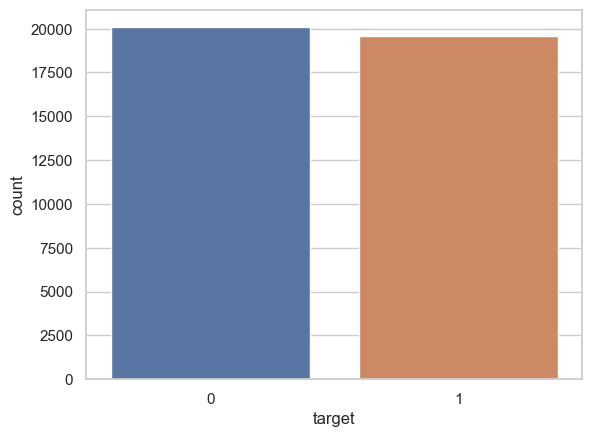

In [14]:
sns.countplot(x='target', data=df)

We have do not have an imbalanced dataset.

In [15]:
token_cols = ['n_tokens_title', 'n_tokens_content', 'n_unique_tokens', 'n_non_stop_words', 'n_non_stop_unique_tokens', 'average_token_length', 'num_keywords']
links_cols = ['num_hrefs', 'num_self_hrefs']
media_cols = ['num_imgs', 'num_videos']
channel_cols = ['data_channel_is_lifestyle', 'data_channel_is_entertainment', 'data_channel_is_bus', 'data_channel_is_socmed', 'data_channel_is_tech', 'data_channel_is_world']
kw_cols = ['kw_min_min', 'kw_max_min', 'kw_avg_min', 'kw_min_max', 'kw_max_max', 'kw_avg_max', 'kw_min_avg', 'kw_max_avg', 'kw_avg_avg']
self_ref_cols = ['self_reference_min_shares', 'self_reference_max_shares', 'self_reference_avg_shares']
week_cols = ['weekday_is_monday', 'weekday_is_tuesday', 'weekday_is_wednesday', 'weekday_is_thursday', 'weekday_is_friday', 'weekday_is_saturday', 'weekday_is_sunday']
topic_cols = ['LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04']
global_cols = ['global_subjectivity', 'global_sentiment_polarity', 'global_rate_positive_words', 'global_rate_negative_words']
local_cols = ['rate_positive_words', 'rate_negative_words', 'avg_positive_polarity', 'min_positive_polarity', 'max_positive_polarity', 'avg_negative_polarity', 'min_negative_polarity', 'max_negative_polarity']
title_cols = ['title_subjectivity', 'title_sentiment_polarity', 'abs_title_subjectivity', 'abs_title_sentiment_polarity']

all_columns = ['token_cols', 'links_cols', 'media_cols', 'channel_cols', 'kw_cols', 'self_ref_cols',
               'weekday_cols', 'weekend_cols', 'topic_cols', 'global_cols', 'local_cols', 'title_cols']

In [16]:
def viz_box(df, col):
    sns.boxplot(df[col], orient="h")
    plt.title(str(col))
    plt.show()

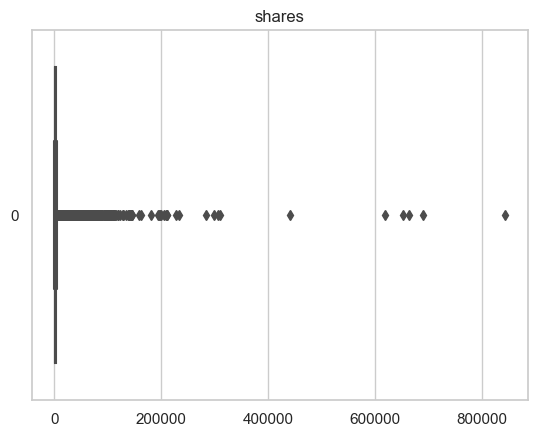

In [17]:
viz_box(df, 'shares')

We see some outliers. Let's remove them.

In [18]:
percentile25 = df['shares'].quantile(0.25)
percentile75 = df['shares'].quantile(0.75)

print("75th quartile: ", percentile75)
print("25th quartile: ", percentile25)

iqr = percentile75 - percentile25

upper_bound = percentile75 + 1.5 * iqr
lower_bound = percentile25 - 1.5 * iqr

df = df[df['shares'] < upper_bound]
df = df[df['shares'] > lower_bound]
print(len(df))

75th quartile:  2800.0
25th quartile:  946.0
35103


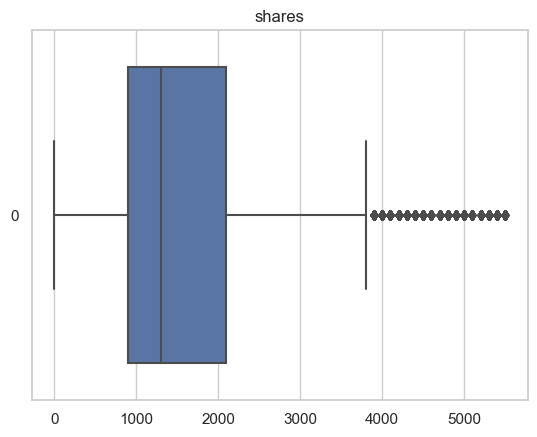

In [19]:
viz_box(df, 'shares')

In [20]:
continuous_cols = token_cols + links_cols + kw_cols + self_ref_cols + global_cols + local_cols + title_cols

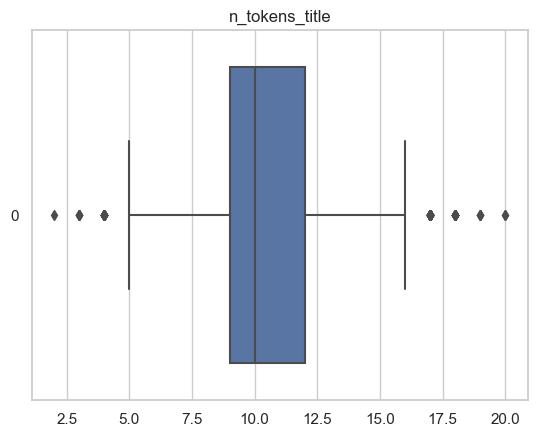

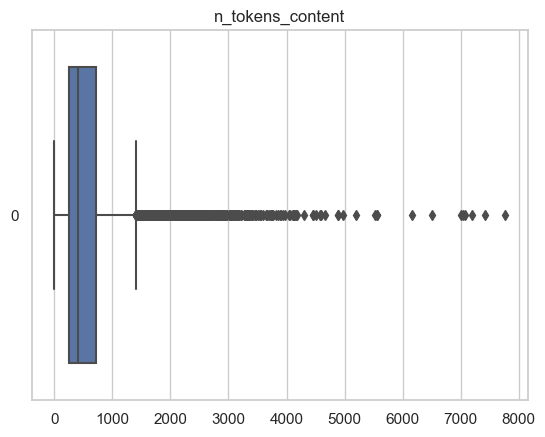

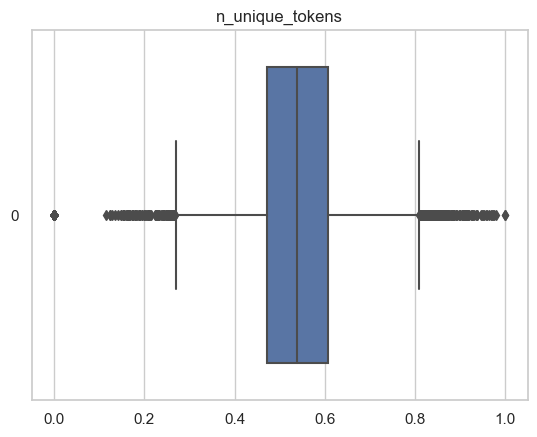

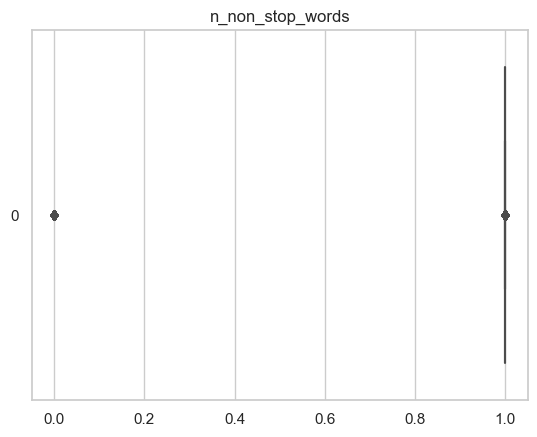

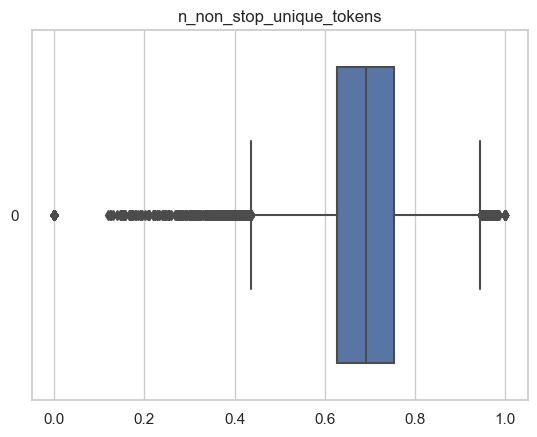

...

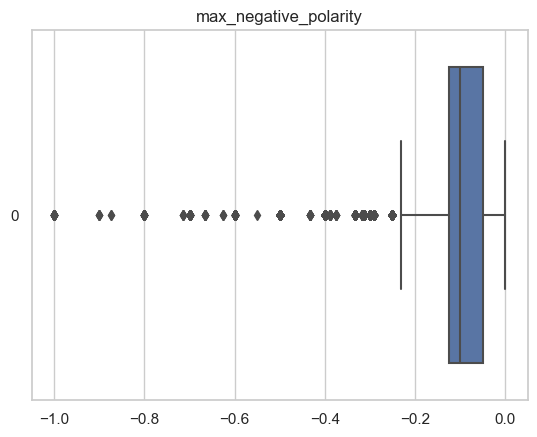

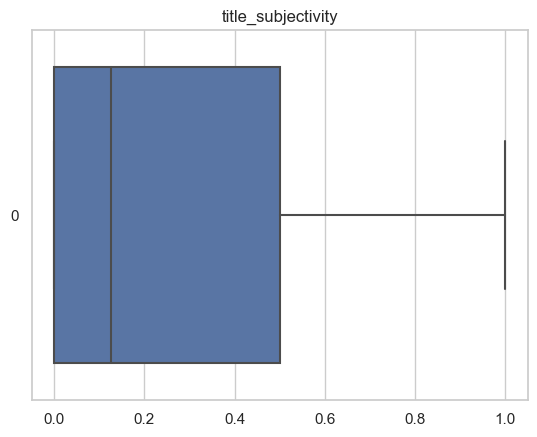

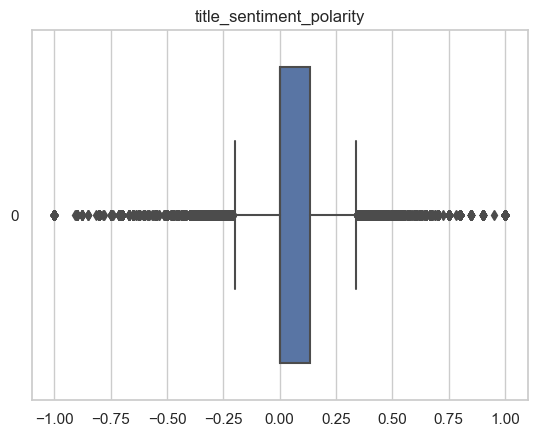

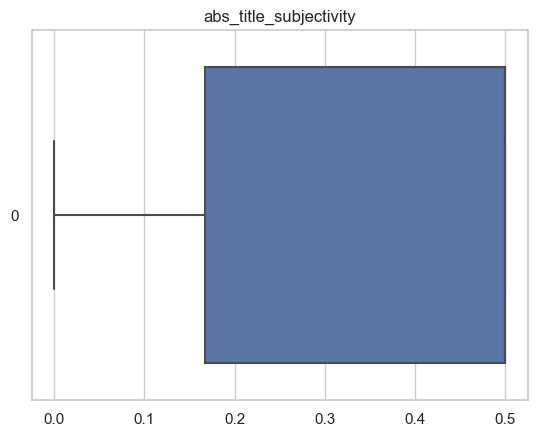

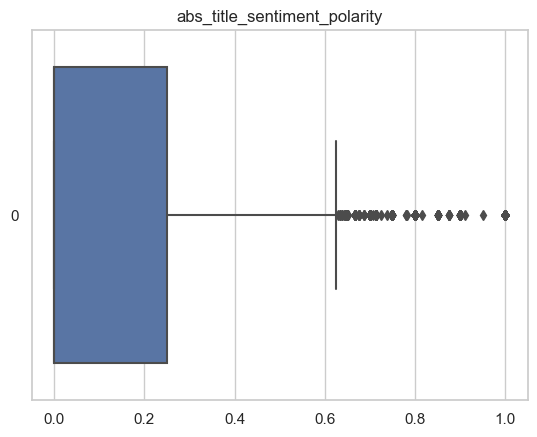

In [21]:
for col in continuous_cols:
    viz_box(df, col)

There's a lot of outliers. Thankfully, Xgboost can handle them so we're not going to spend a any more time on outliers.

In [22]:
unpopular_df = df[df['shares'] < THRESHOLD ]
popular_df = df[df['shares'] >= THRESHOLD ]

Let's see histograms for our continuous variables.

array([[<Axes: title={'center': 'n_tokens_title'}>,
        <Axes: title={'center': 'n_tokens_content'}>,
        <Axes: title={'center': 'n_unique_tokens'}>,
        <Axes: title={'center': 'n_non_stop_words'}>,
        <Axes: title={'center': 'n_non_stop_unique_tokens'}>,
        <Axes: title={'center': 'average_token_length'}>],
       [<Axes: title={'center': 'num_keywords'}>,
        <Axes: title={'center': 'num_hrefs'}>,
        <Axes: title={'center': 'num_self_hrefs'}>,
        <Axes: title={'center': 'kw_min_min'}>,
        <Axes: title={'center': 'kw_max_min'}>,
        <Axes: title={'center': 'kw_avg_min'}>],
       [<Axes: title={'center': 'kw_min_max'}>,
        <Axes: title={'center': 'kw_max_max'}>,
        <Axes: title={'center': 'kw_avg_max'}>,
        <Axes: title={'center': 'kw_min_avg'}>,
        <Axes: title={'center': 'kw_max_avg'}>,
        <Axes: title={'center': 'kw_avg_avg'}>],
       [<Axes: title={'center': 'self_reference_min_shares'}>,
        <Axes: title

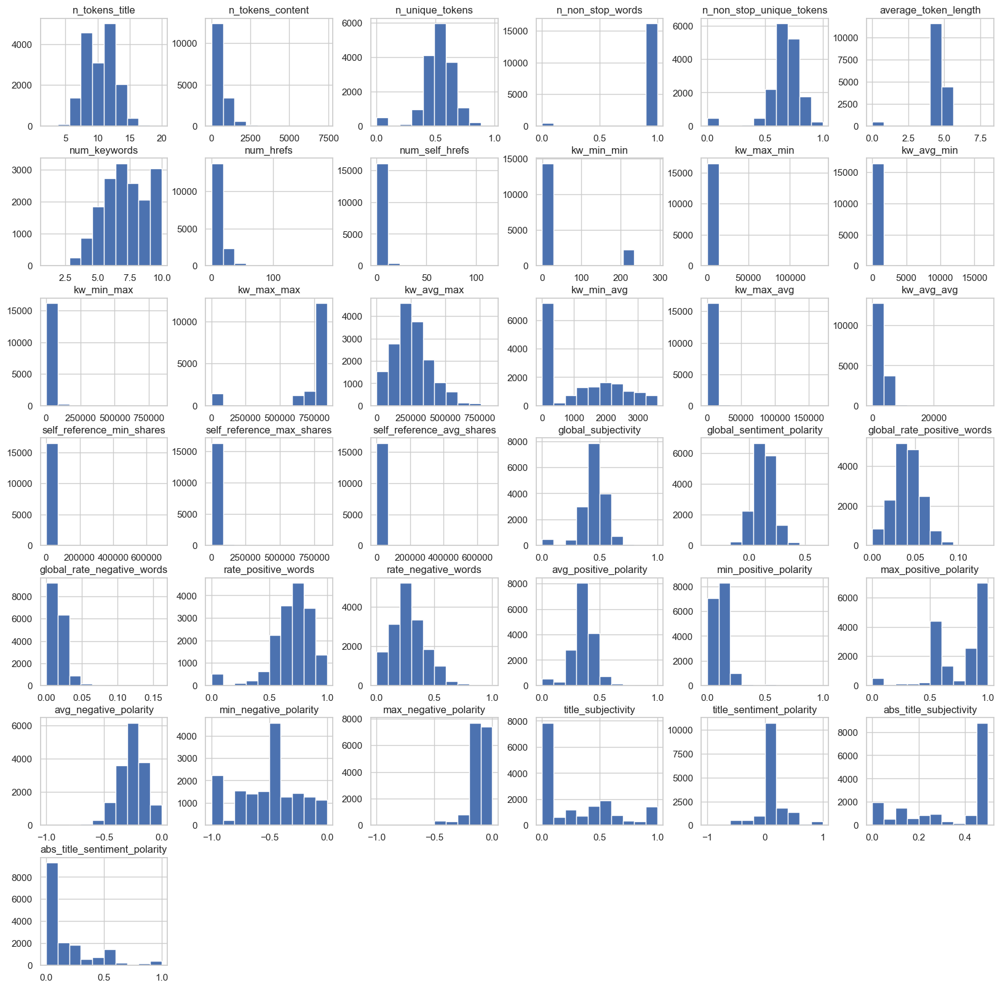

In [23]:
popular_df[continuous_cols].hist(figsize=(20,20))
plt.show()

array([[<Axes: title={'center': 'n_tokens_title'}>,
        <Axes: title={'center': 'n_tokens_content'}>,
        <Axes: title={'center': 'n_unique_tokens'}>,
        <Axes: title={'center': 'n_non_stop_words'}>,
        <Axes: title={'center': 'n_non_stop_unique_tokens'}>,
        <Axes: title={'center': 'average_token_length'}>],
       [<Axes: title={'center': 'num_keywords'}>,
        <Axes: title={'center': 'num_hrefs'}>,
        <Axes: title={'center': 'num_self_hrefs'}>,
        <Axes: title={'center': 'kw_min_min'}>,
        <Axes: title={'center': 'kw_max_min'}>,
        <Axes: title={'center': 'kw_avg_min'}>],
       [<Axes: title={'center': 'kw_min_max'}>,
        <Axes: title={'center': 'kw_max_max'}>,
        <Axes: title={'center': 'kw_avg_max'}>,
        <Axes: title={'center': 'kw_min_avg'}>,
        <Axes: title={'center': 'kw_max_avg'}>,
        <Axes: title={'center': 'kw_avg_avg'}>],
       [<Axes: title={'center': 'self_reference_min_shares'}>,
        <Axes: title

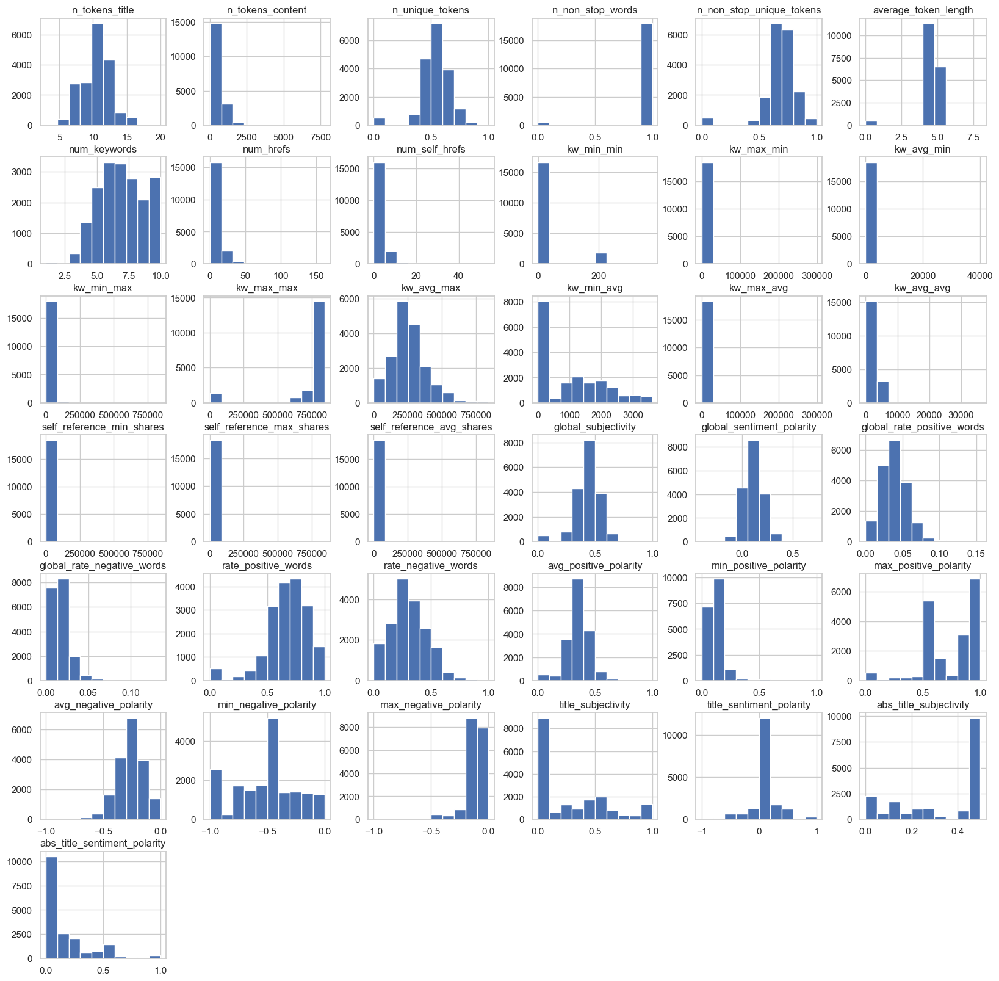

In [24]:
unpopular_df[continuous_cols].hist(figsize=(20,20))
plt.show()

Let's explore correlation between the variables.

<Axes: >

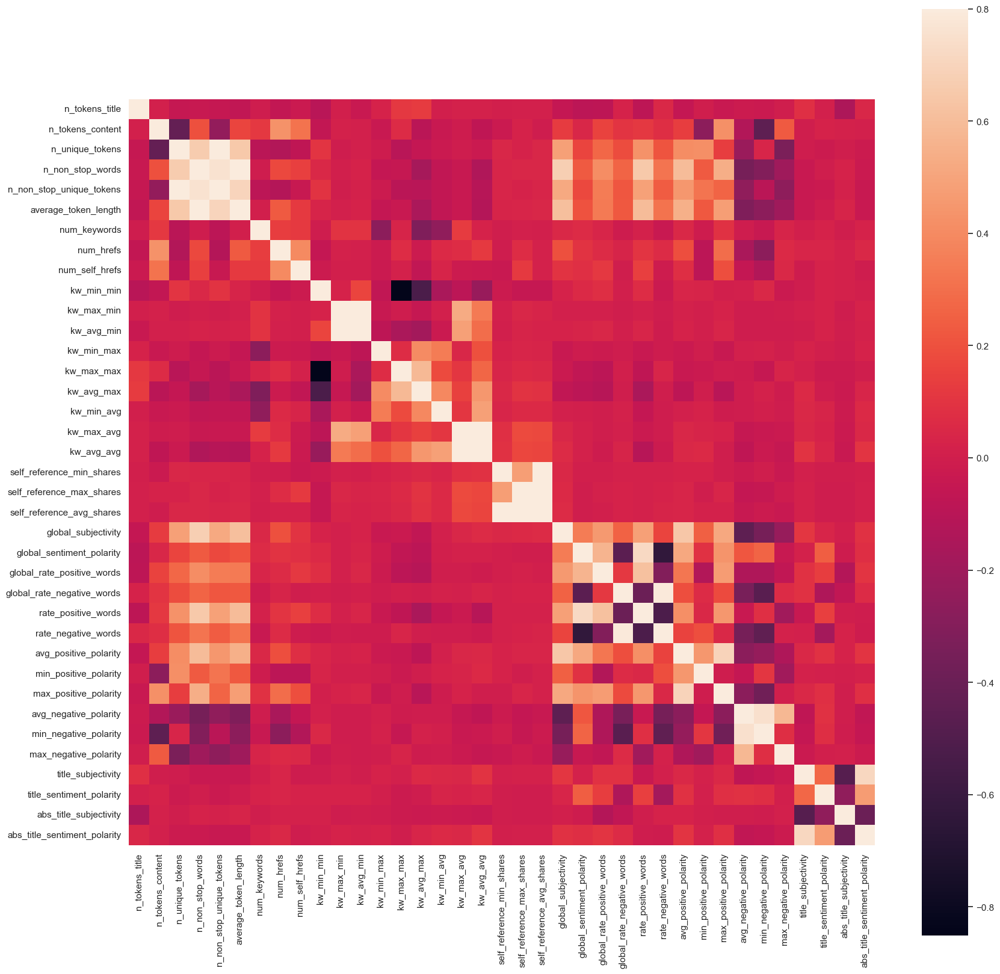

In [25]:
corr = popular_df[continuous_cols].corr()
fig = plt.figure(figsize = (20,20))
sns.heatmap(corr, vmax = .8, square = True)
plt.show()

<Axes: >

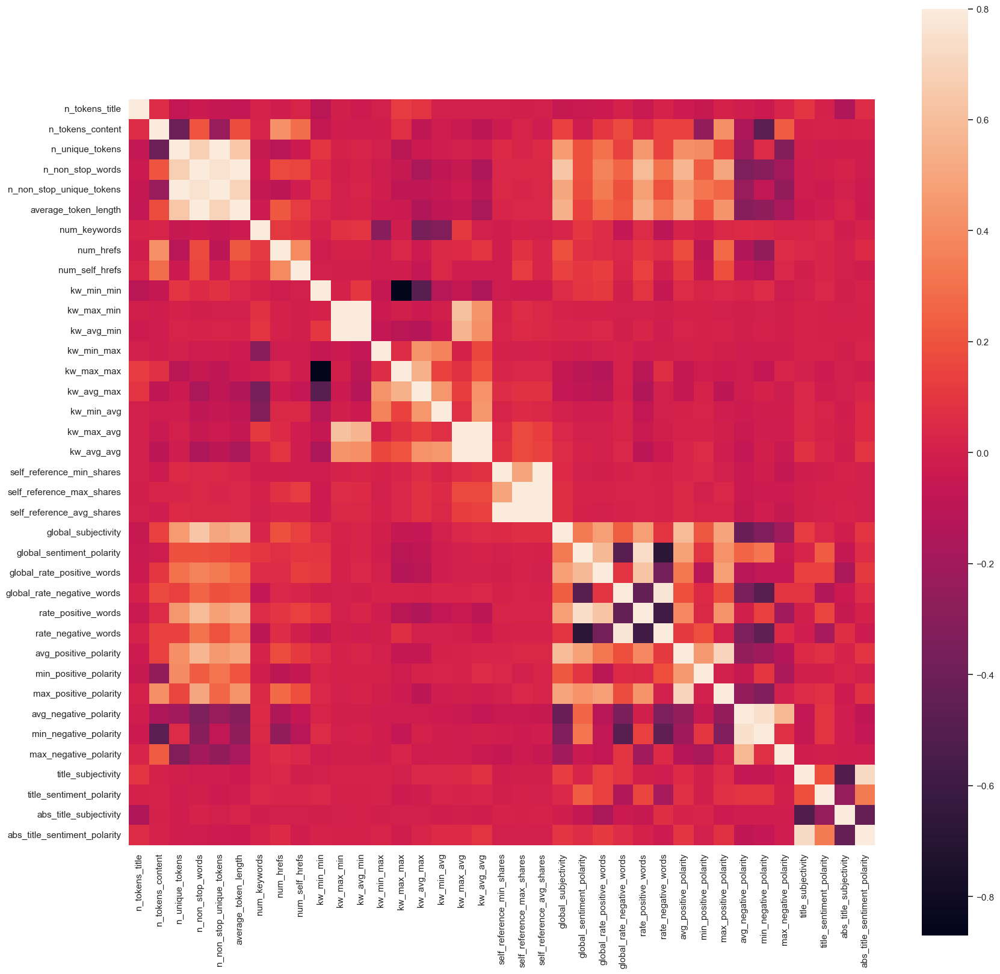

In [26]:
corr = unpopular_df[continuous_cols].corr()
fig = plt.figure(figsize = (20,20))
sns.heatmap(corr, vmax = .8, square = True)
plt.show()

<Figure size 1200x500 with 0 Axes>

<BarContainer object of 7 artists>

<BarContainer object of 7 artists>

Text(0.5, 0, 'Days of the Week')

Text(0, 0.5, 'Count of News Articles')

Text(0.5, 1.0, 'Count of Popular and Unpopular News Articles over Days of the Week')

([<matplotlib.axis.XTick at 0x1af571115b0>,
 [Text(0.15, 0, 'Monday'),
  Text(1.15, 0, 'Tuesday'),
  Text(2.15, 0, 'Wednesday'),
  Text(3.15, 0, 'Thursday'),
  Text(4.15, 0, 'Friday'),
  Text(5.15, 0, 'Saturday'),
  Text(6.15, 0, 'Sunday')])

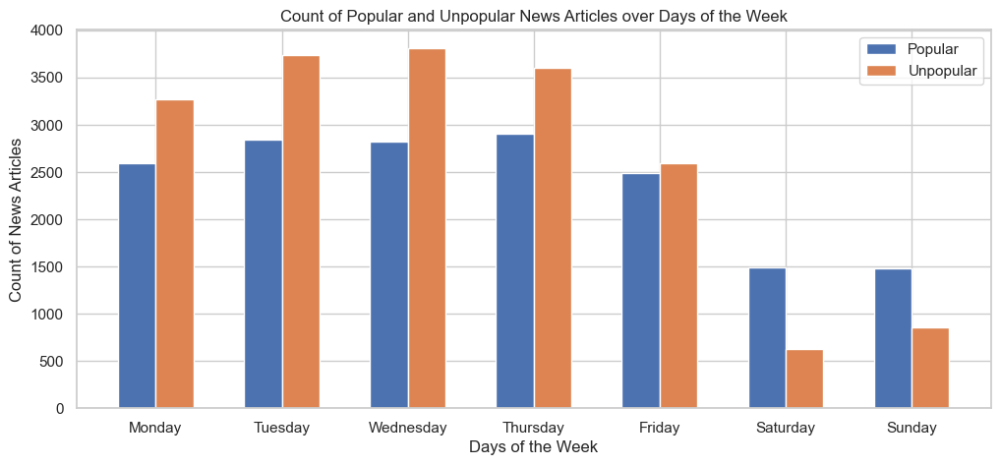

In [27]:
# Adapted from
# https://stackoverflow.com/questions/10369681/how-to-plot-bar-graphs-with-same-x-coordinates-side-by-side-dodged

# Numbers of pairs of bars you want
N = 7

# Data on X-axis

# Specify the values of blue bars (height)
popular_week = popular_df[week_cols].sum().values
# Specify the values of orange bars (height)
unpopular_week = unpopular_df[week_cols].sum().values

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(12,5))

# Width of a bar 
width = 0.3       

# Plotting
plt.bar(ind, popular_week , width, label='Popular')
plt.bar(ind + width, unpopular_week, width, label='Unpopular')

plt.xlabel('Days of the Week')
plt.ylabel('Count of News Articles')
plt.title('Count of Popular and Unpopular News Articles over Days of the Week')

# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width / 2, ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'))

# Finding the best position for legends and putting it
plt.legend(loc='best')
plt.show()

<Figure size 1200x500 with 0 Axes>

<BarContainer object of 7 artists>

<BarContainer object of 7 artists>

Text(0.5, 0, 'Days of the Week')

Text(0, 0.5, 'Count of News Articles')

Text(0.5, 1.0, 'Count of Popular and Unpopular News Articles over Days of the Week')

([<matplotlib.axis.XTick at 0x1af57107700>,
 [Text(0.15, 0, 'Monday'),
  Text(1.15, 0, 'Tuesday'),
  Text(2.15, 0, 'Wednesday'),
  Text(3.15, 0, 'Thursday'),
  Text(4.15, 0, 'Friday'),
  Text(5.15, 0, 'Saturday'),
  Text(6.15, 0, 'Sunday')])

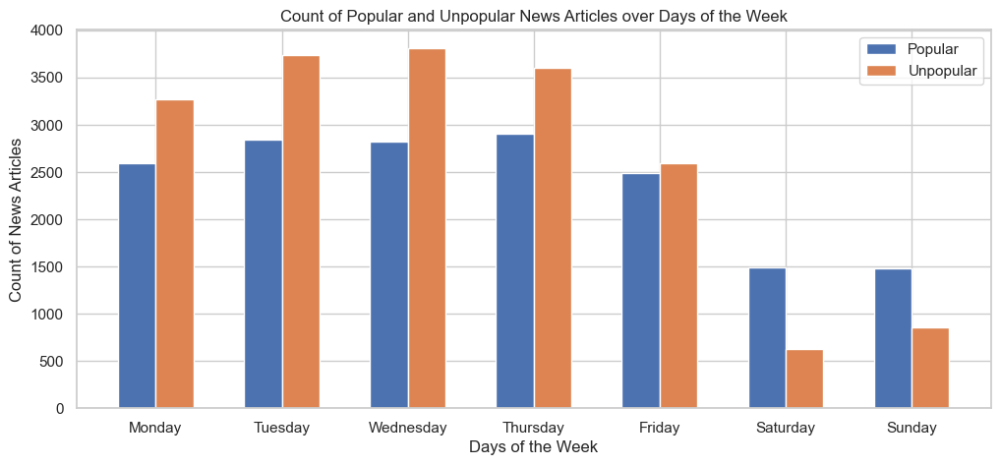

In [28]:
# Adapted from
# https://stackoverflow.com/questions/10369681/how-to-plot-bar-graphs-with-same-x-coordinates-side-by-side-dodged

# Numbers of pairs of bars you want
N = 7

# Data on X-axis

# Specify the values of blue bars (height)
popular_week = popular_df[week_cols].sum().values
# Specify the values of orange bars (height)
unpopular_week = unpopular_df[week_cols].sum().values

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(12,5))

# Width of a bar 
width = 0.3       

# Plotting
plt.bar(ind, popular_week , width, label='Popular')
plt.bar(ind + width, unpopular_week, width, label='Unpopular')

plt.xlabel('Days of the Week')
plt.ylabel('Count of News Articles')
plt.title('Count of Popular and Unpopular News Articles over Days of the Week')

# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width / 2, ('Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'))

# Finding the best position for legends and putting it
plt.legend(loc='best')
plt.show()

<Figure size 1200x500 with 0 Axes>

<BarContainer object of 6 artists>

<BarContainer object of 6 artists>

Text(0.5, 0, 'Channels')

Text(0, 0.5, 'Count of News Articles')

Text(0.5, 1.0, 'Count of Popular and Unpopular News Articles over Days of the Week')

([<matplotlib.axis.XTick at 0x1af5720e100>,
 [Text(0.15, 0, 'Lifestyle'),
  Text(1.15, 0, 'Entertainment'),
  Text(2.15, 0, 'Business'),
  Text(3.15, 0, 'Social Media'),
  Text(4.15, 0, 'Tech'),
  Text(5.15, 0, 'World')])

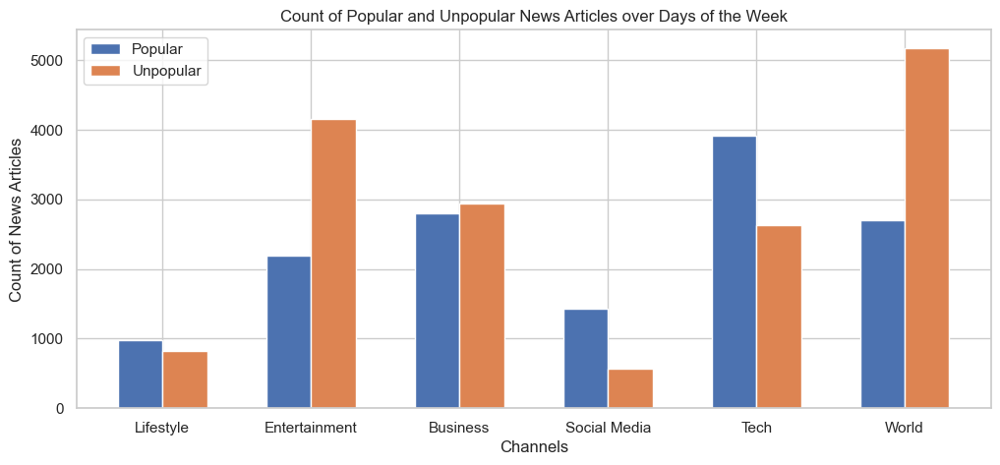

In [29]:
# Adapted from
# https://stackoverflow.com/questions/10369681/how-to-plot-bar-graphs-with-same-x-coordinates-side-by-side-dodged

# Numbers of pairs of bars you want
N = 6

# Data on X-axis

# Specify the values of blue bars (height)
popular_week = popular_df[channel_cols].sum().values
# Specify the values of orange bars (height)
unpopular_week = unpopular_df[channel_cols].sum().values

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(12,5))

# Width of a bar 
width = 0.3       

# Plotting
plt.bar(ind, popular_week , width, label='Popular')
plt.bar(ind + width, unpopular_week, width, label='Unpopular')

plt.xlabel('Channels')
plt.ylabel('Count of News Articles')
plt.title('Count of Popular and Unpopular News Articles over Days of the Week')

# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width / 2, ('Lifestyle', 'Entertainment', 'Business', 'Social Media', 'Tech', 'World'))

# Finding the best position for legends and putting it
plt.legend(loc='best')
plt.show()

<Figure size 1200x500 with 0 Axes>

<BarContainer object of 5 artists>

<BarContainer object of 5 artists>

Text(0.5, 0, 'LDA Topic')

Text(0, 0.5, 'Count of News Articles')

Text(0.5, 1.0, 'Count of Popular and Unpopular News Articles over LDA Topics')

([<matplotlib.axis.XTick at 0x1af5728ce80>,
 [Text(0.15, 0, 'LDA_00'),
  Text(1.15, 0, 'LDA_01'),
  Text(2.15, 0, 'LDA_02'),
  Text(3.15, 0, 'LDA_03'),
  Text(4.15, 0, 'LDA_04')])

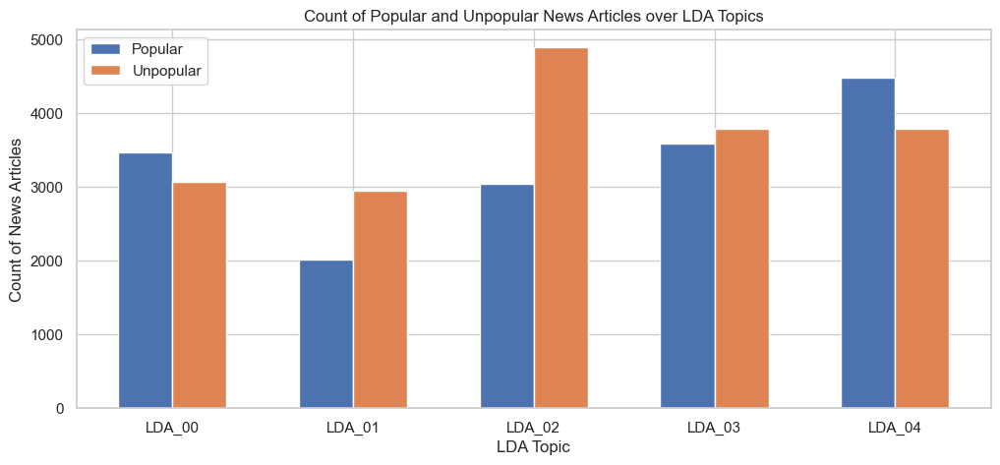

In [30]:
# Adapted from
# https://stackoverflow.com/questions/10369681/how-to-plot-bar-graphs-with-same-x-coordinates-side-by-side-dodged

# Numbers of pairs of bars you want
N = 5

# Data on X-axis

# Specify the values of blue bars (height)
popular_week = popular_df[topic_cols].sum().values
# Specify the values of orange bars (height)
unpopular_week = unpopular_df[topic_cols].sum().values

# Position of bars on x-axis
ind = np.arange(N)

# Figure size
plt.figure(figsize=(12,5))

# Width of a bar 
width = 0.3       

# Plotting
plt.bar(ind, popular_week , width, label='Popular')
plt.bar(ind + width, unpopular_week, width, label='Unpopular')

plt.xlabel('LDA Topic')
plt.ylabel('Count of News Articles')
plt.title('Count of Popular and Unpopular News Articles over LDA Topics')

# xticks()
# First argument - A list of positions at which ticks should be placed
# Second argument -  A list of labels to place at the given locations
plt.xticks(ind + width / 2, ('LDA_00', 'LDA_01', 'LDA_02', 'LDA_03', 'LDA_04'))

# Finding the best position for legends and putting it
plt.legend(loc='best')
plt.show()

In [31]:
ttest_same = []
ttest_diff = []

for column in continuous_cols:
    
    result = stats.ttest_ind(popular_df[column], unpopular_df[column])[1]
    
    if result > ALPHA:
        interpretation = 'insignificant - SAME'
        ttest_same.append(column)
    else:
        interpretation = 'significant - DIFFERENT'
        ttest_diff.append(column)
        
    print(result, '-', column, ' - ', interpretation)

2.2504282720304512e-19 - n_tokens_title  -  significant - DIFFERENT
1.540713115573688e-19 - n_tokens_content  -  significant - DIFFERENT
2.9880436047459157e-20 - n_unique_tokens  -  significant - DIFFERENT
0.1936199104088964 - n_non_stop_words  -  insignificant - SAME
1.3901924209284012e-20 - n_non_stop_unique_tokens  -  significant - DIFFERENT
0.0008373135389349559 - average_token_length  -  significant - DIFFERENT
5.124818509804509e-38 - num_keywords  -  significant - DIFFERENT
2.864037347216668e-48 - num_hrefs  -  significant - DIFFERENT
1.8442399645567025e-18 - num_self_hrefs  -  significant - DIFFERENT
5.950648914047732e-29 - kw_min_min  -  significant - DIFFERENT
5.100318754407514e-05 - kw_max_min  -  significant - DIFFERENT
1.344140676190898e-10 - kw_avg_min  -  significant - DIFFERENT
0.4989833952664203 - kw_min_max  -  insignificant - SAME
4.375358509213268e-17 - kw_max_max  -  significant - DIFFERENT
0.5208306960828408 - kw_avg_max  -  insignificant - SAME
3.159778399488084e-

In [32]:
shap_yesn = []
shap_notn = []

for column in continuous_cols:
    
    stat, result = stats.shapiro(df[column])
    
    if result > ALPHA:
        interpretation = 'insignificant - NORMAL'
        shap_yesn.append(column)
    else:
        interpretation = 'significant - NOT NORMAL'
        shap_notn.append(column)
        
    print(result, '-', column, ' - ', interpretation)

0.0 - n_tokens_title  -  significant - NOT NORMAL
0.0 - n_tokens_content  -  significant - NOT NORMAL
0.0 - n_unique_tokens  -  significant - NOT NORMAL
0.0 - n_non_stop_words  -  significant - NOT NORMAL
0.0 - n_non_stop_unique_tokens  -  significant - NOT NORMAL
0.0 - average_token_length  -  significant - NOT NORMAL
0.0 - num_keywords  -  significant - NOT NORMAL
0.0 - num_hrefs  -  significant - NOT NORMAL
0.0 - num_self_hrefs  -  significant - NOT NORMAL
0.0 - kw_min_min  -  significant - NOT NORMAL
0.0 - kw_max_min  -  significant - NOT NORMAL
0.0 - kw_avg_min  -  significant - NOT NORMAL
0.0 - kw_min_max  -  significant - NOT NORMAL
0.0 - kw_max_max  -  significant - NOT NORMAL
0.0 - kw_avg_max  -  significant - NOT NORMAL
0.0 - kw_min_avg  -  significant - NOT NORMAL
0.0 - kw_max_avg  -  significant - NOT NORMAL
0.0 - kw_avg_avg  -  significant - NOT NORMAL
0.0 - self_reference_min_shares  -  significant - NOT NORMAL
0.0 - self_reference_max_shares  -  significant - NOT NORMAL


In [33]:
final_df = df.drop(columns=['shares'])

## MODELING

Let's split the data.

In [34]:
X = final_df.loc[:, final_df.columns != 'target']
y = final_df.loc[:, final_df.columns == 'target']

In [35]:
# Train Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=493)

### Logistics Regression Models

In [36]:
logreg0 = LogisticRegression()
logreg0.fit(X_train, y_train)

LogisticRegression()

In [37]:
print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg0.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg0.score(X_test, y_test)))

Accuracy of logistic regression classifier on train set: 0.59
Accuracy of logistic regression classifier on test set: 0.59


In [38]:
y_pred = logreg0.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.60      0.84      0.70      5952
           1       0.56      0.26      0.35      4579

    accuracy                           0.59     10531
   macro avg       0.58      0.55      0.52     10531
weighted avg       0.58      0.59      0.55     10531



In [39]:
# parameter grid
parameters = {
    'penalty' : ['l1','l2'], 
    'C'       : np.logspace(-3,3,7),
    'solver'  : ['newton-cg', 'lbfgs', 'liblinear'],
}

In [40]:
logreg1 = LogisticRegression()
clf = GridSearchCV(logreg1,                   # model
                   param_grid = parameters,   # hyperparameters
                   scoring='accuracy',        # metric for scoring
                   cv=10)                     # number of folds

clf.fit(X_train,y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l1', 'l2'],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [41]:
print("Tuned Hyperparameters :", clf.best_params_)
print("Logistic Regression) Accuracy :",clf.best_score_)

Tuned Hyperparameters : {'C': 1.0, 'penalty': 'l1', 'solver': 'liblinear'}
Logistic Regression) Accuracy : 0.6560726017194691


In [42]:
logreg2 = LogisticRegression(C = 10, 
                            penalty = 'l1', 
                            solver = 'liblinear')
logreg2.fit(X_train,y_train)

print('Accuracy of logistic regression classifier on train set: {:.2f}'.format(logreg2.score(X_train, y_train)))
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg2.score(X_test, y_test)))

LogisticRegression(C=10, penalty='l1', solver='liblinear')

Accuracy of logistic regression classifier on train set: 0.66
Accuracy of logistic regression classifier on test set: 0.65


In [43]:
y_pred = logreg2.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.65      0.80      0.72      5952
           1       0.63      0.46      0.53      4579

    accuracy                           0.65     10531
   macro avg       0.64      0.63      0.62     10531
weighted avg       0.64      0.65      0.64     10531



<Figure size 640x480 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic')

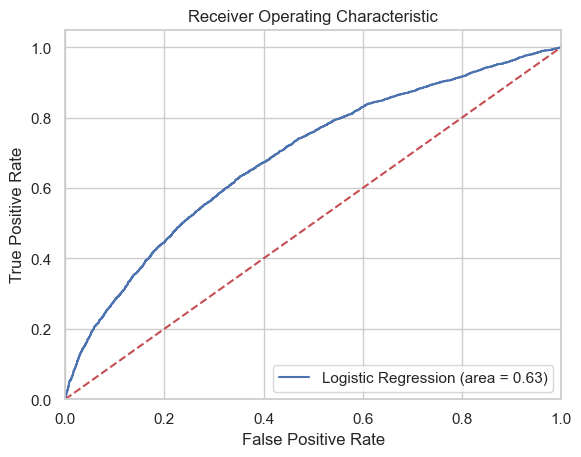

In [44]:
logreg_roc_auc = roc_auc_score(y_test, logreg2.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg2.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logreg_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")

### Xgboost Models

In [45]:
# initial XGBOOST model
xgb0 = XGBClassifier(tree_method = 'gpu_hist')
xgb0.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [46]:
print('Accuracy of xgboost classifier on train set: {:.2f}'.format(xgb0.score(X_train, y_train)))
print('Accuracy of xgboost regression classifier on test set: {:.2f}'.format(xgb0.score(X_test, y_test)))

Accuracy of xgboost classifier on train set: 0.90
Accuracy of xgboost regression classifier on test set: 0.64


In [47]:
y_pred = xgb0.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.66      0.75      0.70      5952
           1       0.61      0.50      0.55      4579

    accuracy                           0.64     10531
   macro avg       0.64      0.63      0.63     10531
weighted avg       0.64      0.64      0.64     10531



In [48]:
pipe = Pipeline([
  ('fs', SelectKBest()),
  ('clf', xgb.XGBClassifier(objective='binary:logistic'))
])

In [49]:
# Define our search space for grid search
search_space = [
  {
    'clf__n_estimators': [100, 200],
    'clf__learning_rate': [0.1, 0.01],
    'clf__max_depth': [3, 4, 5],
    'clf__colsample_bytree': [0.1, 0.2],
    'clf__gamma': [0],
    'clf__tree_method': ['gpu_hist'],
    'fs__score_func': [f_classif],
    'fs__k': [10],
  }
]

In [50]:
# Define cross validation
kfold = KFold(n_splits=10)
# AUC and accuracy as score
scoring = {'AUC':'roc_auc', 'Accuracy':make_scorer(accuracy_score)}

In [51]:
# Define grid search
grid = GridSearchCV(
  pipe,
  param_grid=search_space,
  cv=kfold,
  scoring=scoring,
  refit='AUC',
  verbose=1,
  n_jobs=-1
)
# Fit grid search
xgb1 = grid.fit(X_train, y_train)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


In [52]:
print('Accuracy of xgboost classifier on train set: {:.2f}'.format(xgb1.score(X_train, y_train)))
print('Accuracy of xgboost regression classifier on test set: {:.2f}'.format(xgb1.score(X_test, y_test)))

Accuracy of xgboost classifier on train set: 0.69
Accuracy of xgboost regression classifier on test set: 0.67


In [53]:
y_pred = xgb1.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.65      0.80      0.71      5952
           1       0.62      0.43      0.51      4579

    accuracy                           0.64     10531
   macro avg       0.64      0.62      0.61     10531
weighted avg       0.64      0.64      0.63     10531



In [54]:
print(xgb1.best_params_)

{'clf__colsample_bytree': 0.2, 'clf__gamma': 0, 'clf__learning_rate': 0.1, 'clf__max_depth': 3, 'clf__n_estimators': 200, 'clf__tree_method': 'gpu_hist', 'fs__k': 10, 'fs__score_func': <function f_classif at 0x000001AF47C4C0D0>}


In [55]:
xgb2 = XGBClassifier(colsample_bytree=.2,
                     gamma=0,
                     learning_rate=0.1,
                     max_depth=4,
                     n_estimators=200,
                     tree_method = 'gpu_hist'
                    )
xgb2.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.2, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=200, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [56]:
print('Accuracy of xgboost classifier on train set: {:.2f}'.format(xgb2.score(X_train, y_train)))
print('Accuracy of xgboost regression classifier on test set: {:.2f}'.format(xgb2.score(X_test, y_test)))

Accuracy of xgboost classifier on train set: 0.73
Accuracy of xgboost regression classifier on test set: 0.66


In [57]:
y_pred = xgb2.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.67      0.79      0.72      5952
           1       0.64      0.50      0.57      4579

    accuracy                           0.66     10531
   macro avg       0.66      0.65      0.65     10531
weighted avg       0.66      0.66      0.66     10531



<Figure size 640x480 with 0 Axes>

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic')

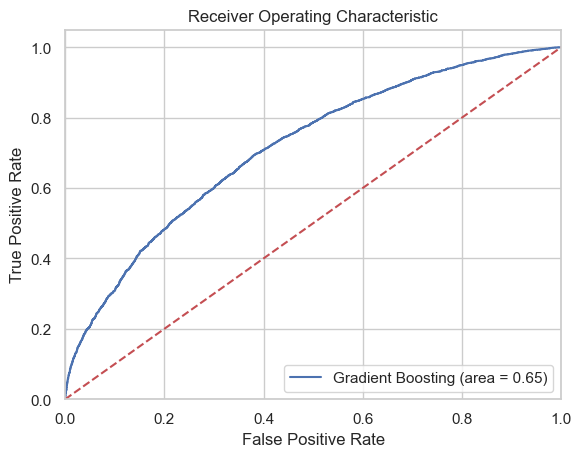

In [58]:
xgbc_roc_auc = roc_auc_score(y_test, xgb2.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, xgb2.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Gradient Boosting (area = %0.2f)' % xgbc_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")

(0.0, 1.0)

(0.0, 1.05)

Text(0.5, 0, 'False Positive Rate')

Text(0, 0.5, 'True Positive Rate')

Text(0.5, 1.0, 'Receiver Operating Characteristic')

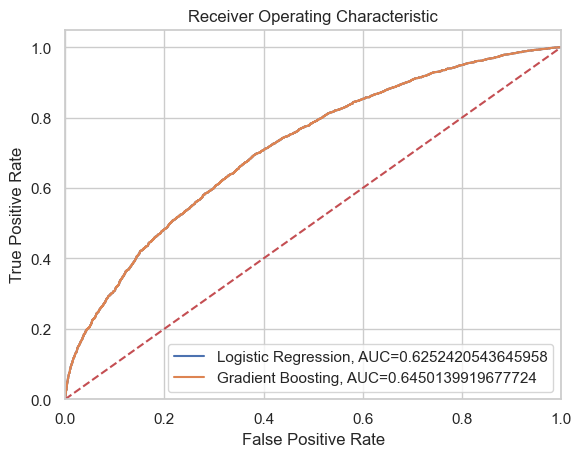

In [59]:
#set up plotting area
plt.figure(0).clf()
plt.plot(fpr,tpr,label="Logistic Regression, AUC=" + str(logreg_roc_auc))
plt.plot(fpr,tpr,label="Gradient Boosting, AUC=" + str(xgbc_roc_auc))
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")

### Feature Importance

In [60]:
explainer = shap.TreeExplainer(xgb2)
shap_values = explainer.shap_values(X)

In [61]:
shap.force_plot(explainer.expected_value, shap_values[:1000,:], X_train.iloc[:1000,:])

<Figure size 2000x2000 with 0 Axes>

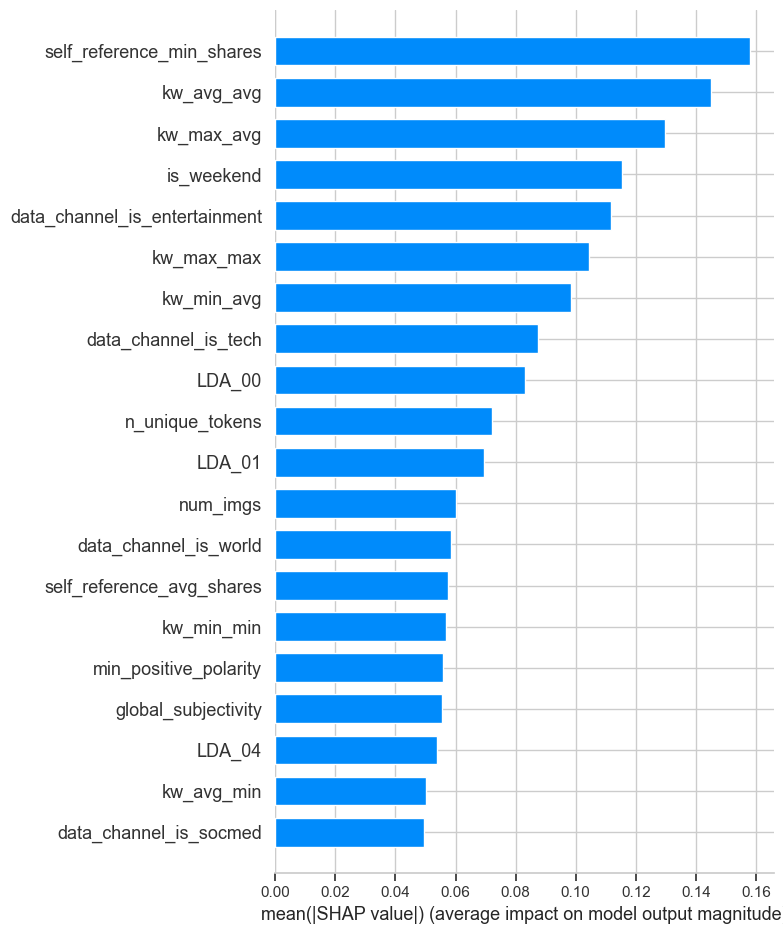

In [62]:
plt.figure(figsize = (20,20))
shap.summary_plot(shap_values, X_train, plot_type="bar",)

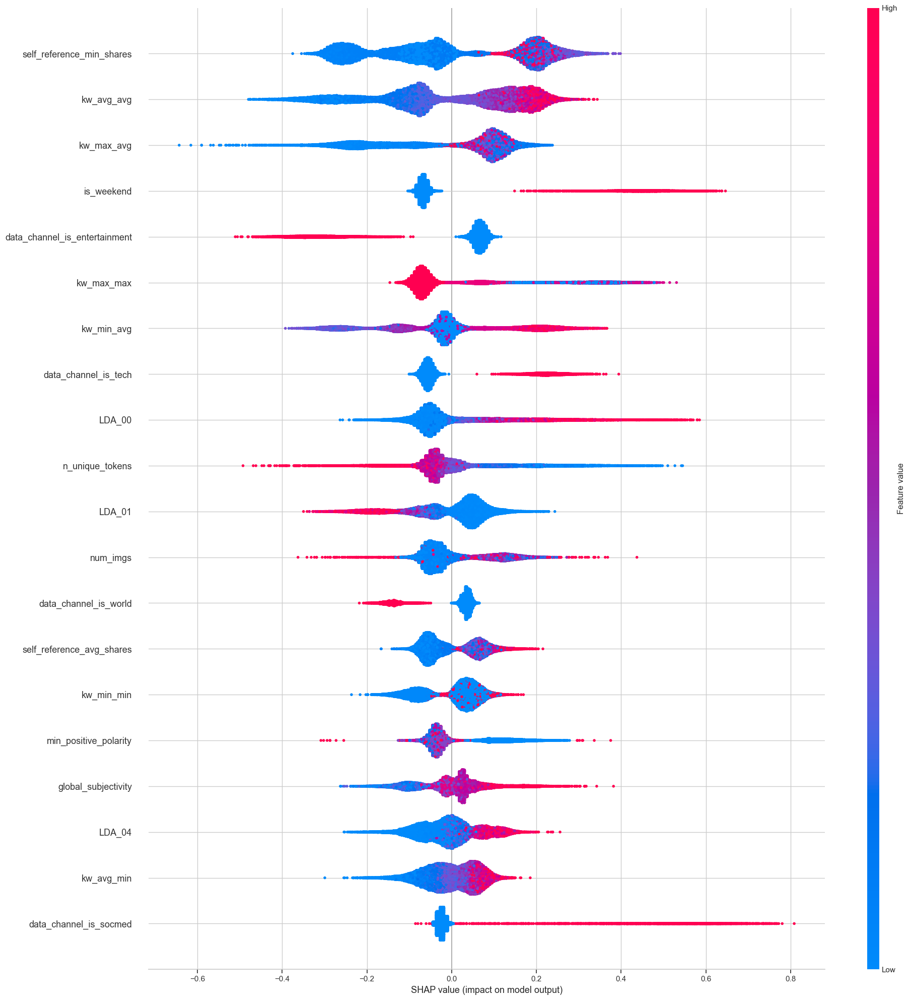

In [63]:
shap.summary_plot(shap_values, X, plot_size=(20,20))

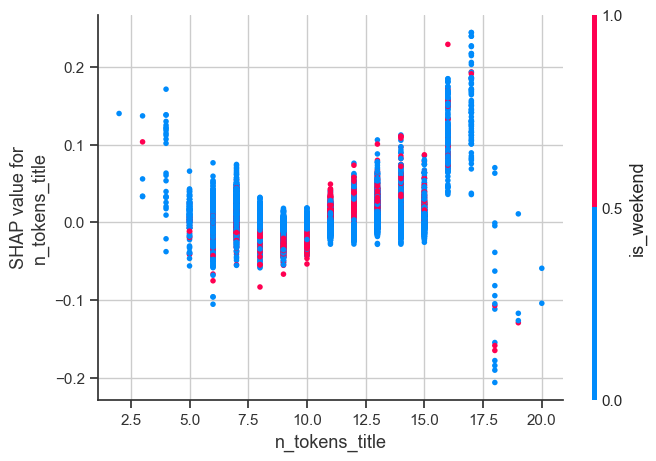

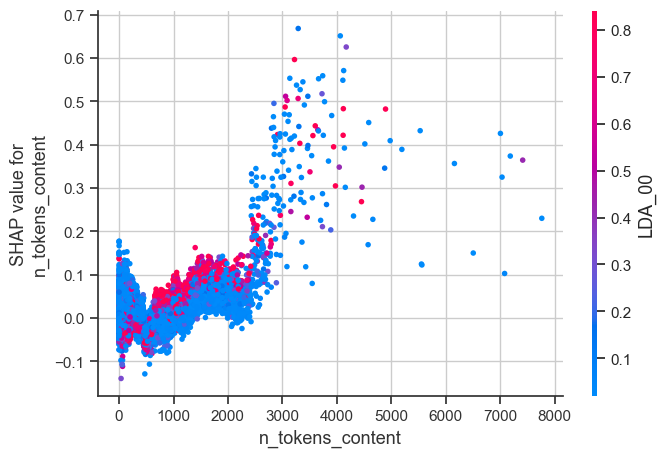

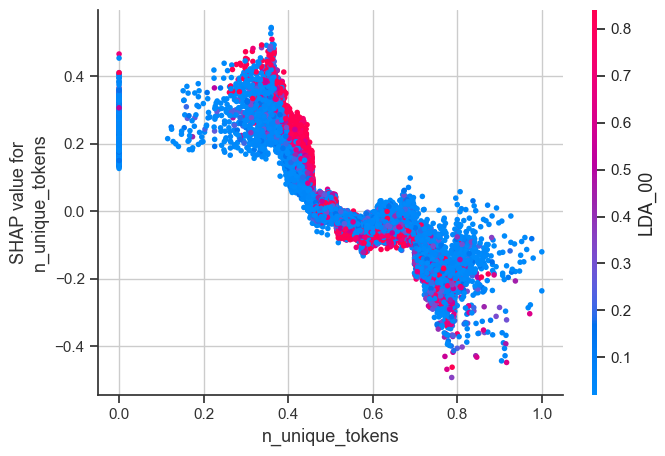

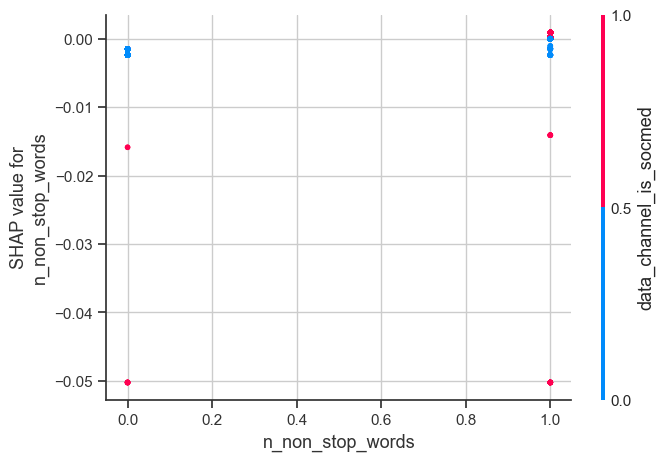

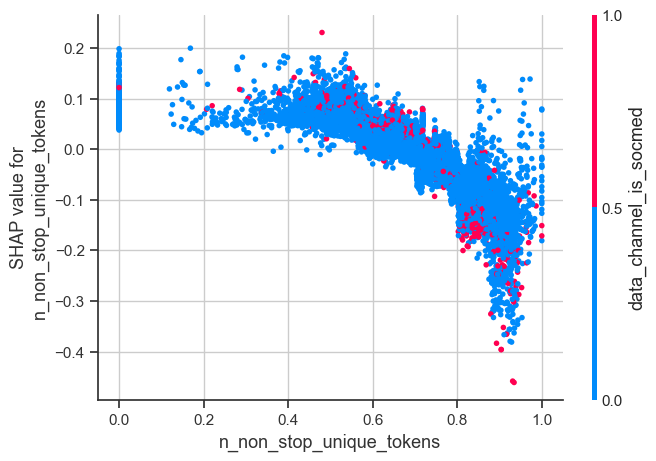

...

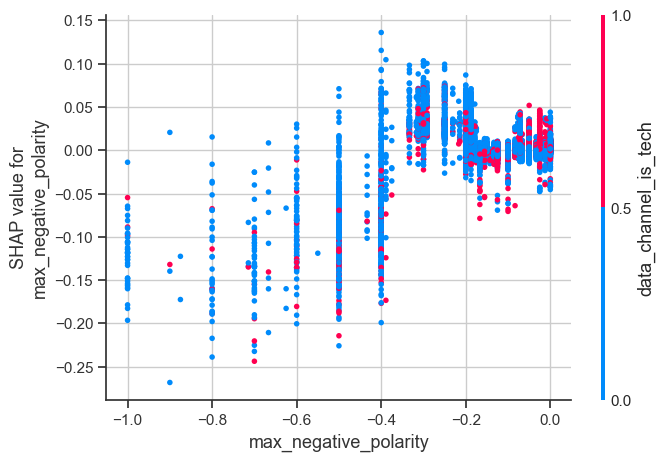

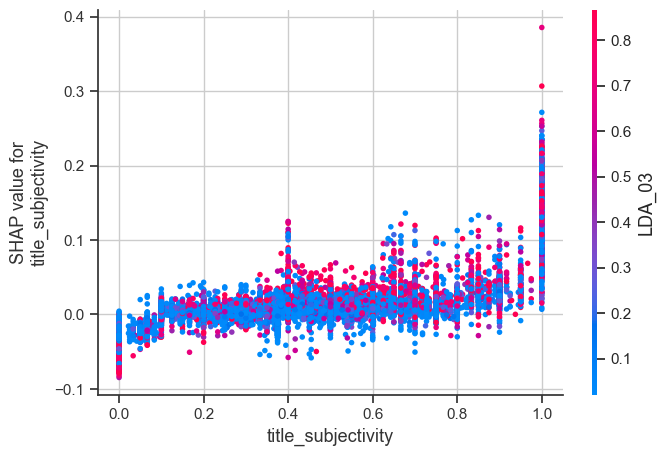

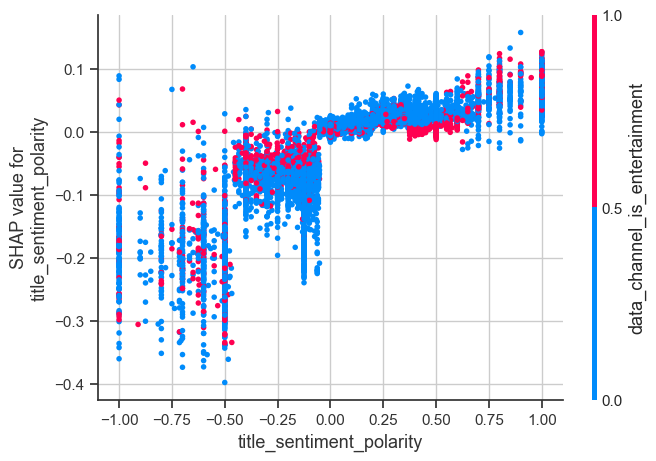

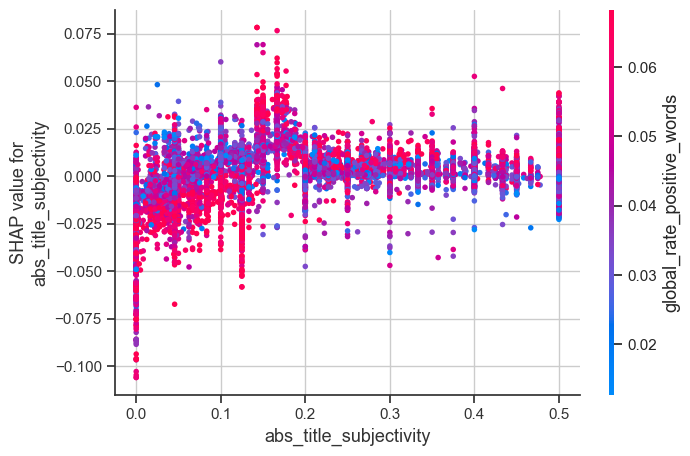

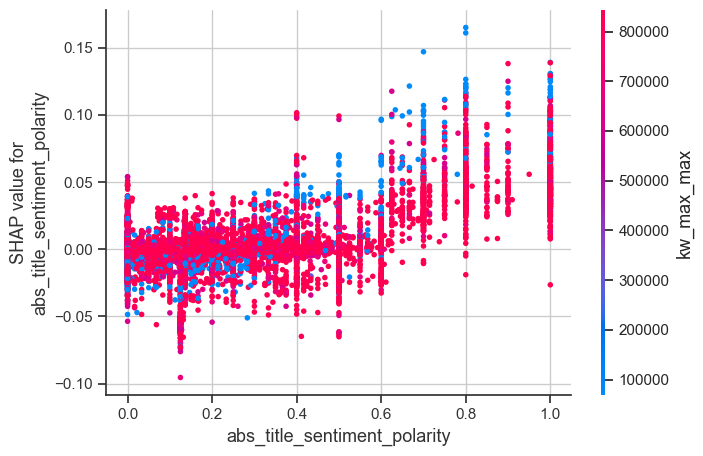

In [64]:
for col in X_train.columns:
    shap.dependence_plot(col, shap_values, X)

## References

- De Dios, Ednalyn. (2020). PAPEM-DM: 7 Steps Towards a Data Science Win. Towards Data Science. https://towardsdatascience.com/papem-dm-7-steps-towards-a-data-science-win-f8cac4f8e02f
- Fernandes, Kelwin, Vinagre, Pedro, Cortez, Paulo, and Sernadela, Pedro. (2015). Online News Popularity. UCI Machine Learning Repository. https://doi.org/10.24432/C5NS3V.

In [65]:
print('Succesful run!')

Succesful run!
